# Master Cluster Analysis
Alloy F, R33_31671
Master File with the main procedure to be applied to all reconstructions with clusters

In [1]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import clustering_corrections as cc
import posgenpy as pgp
import os
import subprocess
from time import perf_counter
# from sklearn.neighbors import KDTree
import plotly.express as px
import plotly.graph_objects as go

# PosgenPy 
Here you have to optimise $Order (knn)$ and then $d_{max}$ and then $N_{min}$ to find the optimal cluster search parameters


In [90]:
######################### INPUT REQUIRED #########################
sample_name = "R33 31691 R10"
output_folder = "/mnt/d/RTE_21_4245/AlloyD/R33_31691/" # put "/" at the end
posgen_folder = "/home/pklups/apttools-posgen-code/" # put "/" at the end
pos_file_path= "/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_D_50K.POS" 
range_file_path= "/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_D_50K_ICF140TopLevelROI.RRNG" 

random_runs = 10
confidence_threshold = 0.95 # * 100 %

dtd_location = "/home/pklups/apttools-posgen-code/"

# read the ions available in the range file and spit them out
ranged_ions = []
for row in pd.read_csv(range_file_path)['[Ions]']:
    if "Ion" in row:
        ranged_ions.append(row.split(sep='=')[-1])
print(ranged_ions)

['Mo', 'Fe', 'Ni', 'C', 'Cu', 'Cr', 'Si', 'P', 'O', 'V', 'Mn', 'Ga', 'Al', 'Fm']


In [91]:
# select ions
core_ions = ["Ni", "Mn", "Si", "Fm"]
bulk_ions = ["P", "Fe", "Cr", "Cu", "Mo", "C", "O", "V", "Al"]

# check if the ions selected are available in the range file
for ion in (core_ions + bulk_ions):
    if ion not in ranged_ions:
        print(ion, "not found in the range file")

In [92]:
######################### INPUT REQUIRED #########################

# add or remove values in this list
# you can also create the same list for different parameter
order_values = [2, 4, 6, 8, 10, 12]
d_max = 0.55 # select dmax


In [93]:
xml_files = []
output_basename="{sample_name}_dmax{d_max}_order_{order}"

for i, param_value in enumerate(order_values):
    thisName = output_basename.format(d_max=d_max, order=param_value, sample_name=sample_name.replace(" ", "_"))
    xml_output = pgp.write_xml_with_relabelling(xmlFileName=thisName,
                                                posFile=pos_file_path,
                                                rangeFile=range_file_path,
                                                coreIons=core_ions,
                                                bulkIons=bulk_ions,
                                                relabelled_runs=random_runs,
                                                destination_folder=output_folder,
                                                nminV=2,
                                                dmax=d_max,
                                                dtd_file_location=dtd_location,
                                                dclassify=d_max,
                                                knn=param_value
                                                
                                  )
    output_file = output_folder + str(thisName) + ".xml"
    xml_files.append(output_file)

In [6]:
# check if the xml files have been created
for x in xml_files:
    print(x)

/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_2.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_4.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_8.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_10.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_12.xml


In [7]:
# run the cluster analyses
current_directory = os.getcwd()
os.chdir(posgen_folder)
print(os.getcwd())

tic = perf_counter()
for i, xml_file in enumerate(xml_files):
    posgen_output = subprocess.call(["./posgen", xml_file])
    toc = perf_counter()
    time_for_file = pgp.seconds_to_hhmmss((toc-tic))
    print(f"File: {i+1}/{len(xml_files)} analysed. It took {time_for_file}.")
    tic = perf_counter()
    
os.chdir(current_directory)
print(os.getcwd())

/home/pklups/apttools-posgen-code
File: 1/6 analysed. It took 0h 0m 27s.
File: 2/6 analysed. It took 0h 1m 4s.
File: 3/6 analysed. It took 0h 0m 41s.
File: 4/6 analysed. It took 0h 0m 24s.
File: 5/6 analysed. It took 0h 0m 22s.
File: 6/6 analysed. It took 0h 0m 23s.
/mnt/c/Users/Peter/OneDrive - Nexus365/Projects/RR/NI/ubuntu_NI_codes


In [8]:
# correct the results straight away
matrix_ions = ["Fe"]
# decompose the clusters
for xml_file in (xml_files):
    
    # open both files
    cluster_stats_file_path = xml_file.replace(".xml", "_cluster-stats.txt")
    unclustered_stats_file_path = xml_file.replace(".xml", "_unclustered-stats.txt")
    csdf = pd.read_csv(cluster_stats_file_path, sep="\t")
    ucsdf = pd.read_csv(unclustered_stats_file_path, sep="\t")
    
    # decompose
    csdf = cc.decompose_cluster_stats(csdf)
    ucsdf = cc.decompose_cluster_stats(ucsdf)

    # deconvolute Fm peak
    csdf = cc.deconvolute_Fm_clusters(csdf)
    ucsdf = cc.deconvolute_Fm_clusters(ucsdf)
    
    # remove Fe ions in clusters and move them to matrix
    ucsdf.loc[0, matrix_ions] = ucsdf.loc[0, matrix_ions] + csdf.loc[:, matrix_ions].sum()
    csdf.loc[:, matrix_ions] = 0

    # save them as csv files
    csdf.to_csv(cluster_stats_file_path, sep='\t', index=False)
    ucsdf.to_csv(unclustered_stats_file_path, sep='\t', index=False)

    print(xml_file, "corrected")
    

/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_2.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_4.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_8.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_10.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_12.xml corrected


### Plotting threshold value
$(N_{real} - N_{rand})/N_{real}$

([<matplotlib.axis.XTick at 0x7f41f73daa90>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

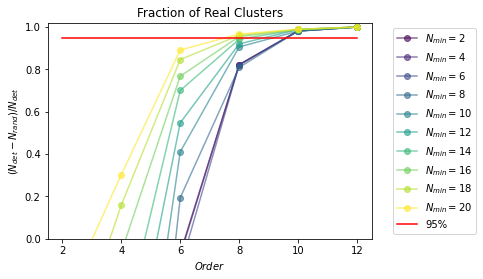

In [9]:
n_min_values = list(range(2, 21, 2))

pgp.plot_real_cluster_ratio_across_swept_param(
    swept_parameters=order_values,
    swept_parameter_name="$Order$",
    random_runs=random_runs,
    xml_files=xml_files,
    n_min_values=n_min_values,
    threshold=confidence_threshold
)

plt.ylim(0.0, 1.02)
plt.xticks(order_values)

([<matplotlib.axis.XTick at 0x7f41f23cba58>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

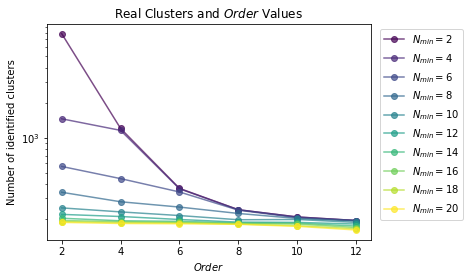

In [10]:
pgp.plot_real_clusters_across_swept_param(
    swept_parameters=order_values,
    swept_parameter_name="$Order$",
    random_runs=random_runs,
    xml_files=xml_files,
    n_min_values=n_min_values
)

plt.yscale("log")
# plt.ylim(0.0, 1.02)
plt.xticks(order_values)

## Find optimal N_min

Find the smallest $N_{min}$ value for each file that satisfies given threshold of real clusters. Default value = 95%

In [11]:
optimal_n_min_values_order, optimised_real_clusters_order, optimised_random_clusters_order = pgp.find_smallest_nmin(
    swept_parameters=order_values,
    swept_parameter_name="order",
    random_runs=random_runs,
    xml_files=xml_files,
    n_min_values=list(range(1, 200, 1)), # go through evey n_min possible up to a high number
    return_real_clusters=True,
    threshold=confidence_threshold
)

print("Nmin values for 95% threshold:", optimal_n_min_values_order)
print("Number of real clusters for optimised Nmin values:", optimised_real_clusters_order)
print("Number of random clusters for optimised Nmin values:", optimised_random_clusters_order)

order: 2 | n_min: 89 | fraction: 0.951 | real clusters: 142
order: 4 | n_min: 53 | fraction: 0.955 | real clusters: 162
order: 6 | n_min: 27 | fraction: 0.958 | real clusters: 177
order: 8 | n_min: 16 | fraction: 0.955 | real clusters: 182
order: 10 | n_min: 1 | fraction: 0.982 | real clusters: 207
order: 12 | n_min: 1 | fraction: 1.0 | real clusters: 193
Nmin values for 95% threshold: [89, 53, 27, 16, 1, 1]
Number of real clusters for optimised Nmin values: [142, 162, 177, 182, 207, 193]
Number of random clusters for optimised Nmin values: [6, 7, 7, 8, 3, 0]


Text(0.5, 1.0, 'Cluster Analysis Parameters for R33 31691 R10')

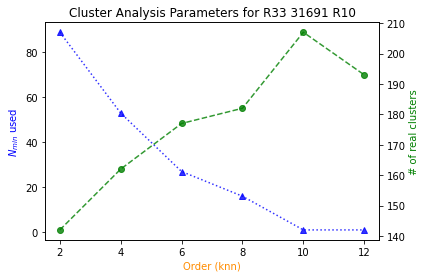

In [12]:
# plot the real clusters after optimisation to select the max point
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(order_values, optimal_n_min_values_order, 'b^:', alpha=0.8)
ax2.plot(order_values, optimised_real_clusters_order, 'go--', alpha=0.8)



ax1.set_xlabel('Order (knn)', color='darkorange')
ax2.set_ylabel('# of real clusters', color='g')
ax1.set_ylabel('$N_{min}$ used', color='b')
# plt.legend(loc='upper right')
plt.title(f"Cluster Analysis Parameters for {sample_name}")
# plt.savefig('optimising_by_max_real_clusters_order_dmax05.jpg', dpi=150)

## Cluster kNN Distance Distribution vs Cluster Size
Let's plot cluster sizes as well as cluster kNN distance distribution to investigate how our parameters affect the clusters that are very close to each other. It's expected to see some of the clusters wrongly split into two or, vice versa, some close agglomerations being joined together and forming mega clusters. These can be seen at the very extremes of these graphs.

In [13]:
# prepare the data
swept_parameter_name = "Order"
df = cc.prepare_df_for_cluster_distr(xml_files, order_values, "Order", include_random=True, n_mins=optimal_n_min_values_order)

In [14]:
# plot distributions of cluster sizes
fig = px.violin(df, y="Cluster Size", x="Order", color="Type", box=False, points="all",
          hover_data=df.columns, color_discrete_map={'real':'#063970', 'random':'#e28743'})

fig.update_layout(
    title_text=f"Size Distributions and Order parameter<br>in {sample_name}",
    xaxis_title='Order',
    yaxis_title="Cluster Size [ions]",
    violingap=0, 
    violinmode='overlay', 
    template='simple_white',
    height=500, 
    width=800
    )

fig.update_yaxes(
    rangemode='nonnegative',
)
fig.update_traces(box_visible=True, meanline_visible=True)
fig.show()

In [15]:
# plot distribution of distances to closest clusters
fig = px.violin(df[df['Type']=='real'], y="Closest Cluster Distance", x="Order", box=False, points="all",
          hover_data=df.columns, 
          color='Type',
          color_discrete_map={'real':'#700539', 'random':'#e28743'}
    )

fig.update_layout(
    title_text=f"kNN Distance Distributions and Order parameter<br>in {sample_name}",
    xaxis_title='Order',
    yaxis_title="kNN Distance [nm]",
    violingap=0, 
    violinmode='overlay', 
    template='simple_white',
    height=500, 
    width=800
    )

fig.update_yaxes(
    rangemode='nonnegative',
)

fig.update_traces(box_visible=True, meanline_visible=True)

fig.show()

In [27]:
# plot selected cluster(s) 
test_df = cc.show_clusters_in_pos(
    clusters_to_plot=[74], 
    xml_files=xml_files,
    swept_param_values=order_values,
    chosen_param_value=6,
    range_file_path=range_file_path
)


/home/pklups/.local/lib/python3.6/site-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Compare cluster shapes 

...across all param clusterID.pos files

In [28]:
# see selected cluster(s) across all param values in one scattered 3d graph
fig = cc.compare_selected_clusters_across_param(
    xml_files=xml_files,
    swept_param_values=order_values,
    swept_param_name='Order',
    chosen_param_value=12,
    selected_clusters=[42, 125]
)
fig.show()

## Plotting cluster composition

In [16]:
# use same colours as in the range file
element_colours = cc.get_element_colours_from_range_file(range_file_path)
# and remove Fm from the list of core ions
# core_ions = ['Ni', 'Mn', 'Si']

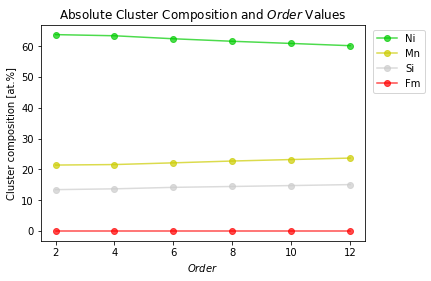

In [17]:
# retrieve the data needed from the cluster stats files for the composition plots
pgp.plot_cluster_composition_across_swept_param_absolute(
    swept_parameters=order_values,
    core_ions=core_ions,
    xml_files=xml_files,
    n_min_values_for_swept_parameters=optimal_n_min_values_order,
    swept_parameter_name="$Order$",
    exclude_ions=None,
    ion_colors=element_colours
)

# plt.savefig('composition_vs_order_dmax05.jpg')

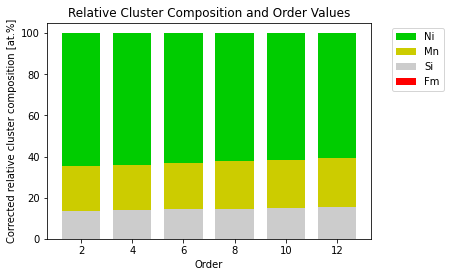

In [18]:
pgp.plot_cluster_composition_across_swept_param_relative(
    swept_parameters=order_values,
    core_ions=core_ions,
    xml_files=xml_files,
    n_min_values_for_swept_parameters=optimal_n_min_values_order,
    swept_parameter_name="Order",
    exclude_ions=None,
    ion_colors=element_colours
)

# $d_{max}$ sweep at specified Order

In [52]:
######################### INPUT REQUIRED #########################

# add or remove values in this list
# you can also create the same list for different parameter
d_max_values = [0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75]
order = 6 # select dmax, hopefully the graphs above can help

In [53]:
xml_files = []
# output_basename="R33_31691_D_dmax{d_max}_order_{order}"
output_basename="{sample_name}_dmax{d_max}_order_{order}"

for i, d_max in enumerate(d_max_values):
    thisName = output_basename.format(order=order, d_max=d_max, sample_name=sample_name.replace(" ", "_"))
    xml_output = pgp.write_xml_with_relabelling(xmlFileName=thisName,
                                                posFile=pos_file_path,
                                                rangeFile=range_file_path,
                                                coreIons=core_ions,
                                                bulkIons=bulk_ions,
                                                relabelled_runs=random_runs,
                                                destination_folder=output_folder,
                                                nminV=2,
                                                dmax=d_max,
                                                dtd_file_location=dtd_location,
                                                dclassify=d_max,
                                                knn=order
                                                
                                  )
    output_file = output_folder + str(thisName) + ".xml"
    xml_files.append(output_file)

In [54]:
# check if the xml files have been created
for x in xml_files:
    print(x)

/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.45_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.65_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.7_order_6.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.75_order_6.xml


In [51]:
current_directory = os.getcwd()
os.chdir(posgen_folder)
print(os.getcwd())

tic = perf_counter()
for i, xml_file in enumerate(xml_files):
    posgen_output = subprocess.call(["./posgen", xml_file])
    toc = perf_counter()
    time_for_file = pgp.seconds_to_hhmmss((toc-tic))
    print(f"File: {i+1}/{len(xml_files)} analysed. It took {time_for_file}.")
    tic = perf_counter()
    
os.chdir(current_directory)
print(os.getcwd())

/home/pklups/apttools-posgen-code
File: 1/3 analysed. It took 0h 0m 20s.
File: 2/3 analysed. It took 0h 0m 22s.
File: 3/3 analysed. It took 0h 0m 25s.
/mnt/c/Users/Peter/OneDrive - Nexus365/Projects/RR/NI/ubuntu_NI_codes


In [55]:
# correct the results straight away
matrix_ions = ["Fe"]
# decompose the clusters
for xml_file in (xml_files):
    
    # open both files
    cluster_stats_file_path = xml_file.replace(".xml", "_cluster-stats.txt")
    unclustered_stats_file_path = xml_file.replace(".xml", "_unclustered-stats.txt")
    csdf = pd.read_csv(cluster_stats_file_path, sep="\t")
    ucsdf = pd.read_csv(unclustered_stats_file_path, sep="\t")
    
    # decompose
    csdf = cc.decompose_cluster_stats(csdf)
    ucsdf = cc.decompose_cluster_stats(ucsdf)

    # deconvolute Fm peak
    csdf = cc.deconvolute_Fm_clusters(csdf)
    ucsdf = cc.deconvolute_Fm_clusters(ucsdf)
    
    # remove Fe ions in clusters and move them to matrix
    ucsdf.loc[0, matrix_ions] = ucsdf.loc[0, matrix_ions] + csdf.loc[:, matrix_ions].sum()
    csdf.loc[:, matrix_ions] = 0

    # save them as csv files
    csdf.to_csv(cluster_stats_file_path, sep='\t', index=False)
    ucsdf.to_csv(unclustered_stats_file_path, sep='\t', index=False)

    print(xml_file, "corrected")
    

/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.45_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.65_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.7_order_6.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.75_order_6.xml corrected


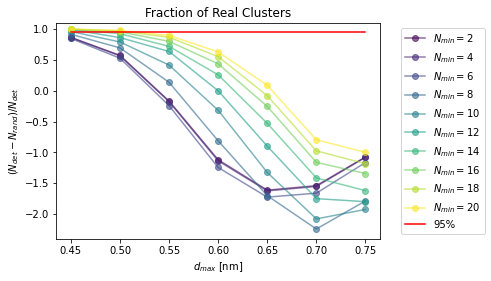

In [56]:
n_min_values = list(range(2, 21, 2))

pgp.plot_real_cluster_ratio_across_swept_param(
    swept_parameters=d_max_values,
    swept_parameter_name="$d_{max}$ [nm]",
    random_runs=random_runs,
    xml_files=xml_files,
    n_min_values=n_min_values,
    threshold=confidence_threshold
)

# plt.ylim(0.5, 1.05)

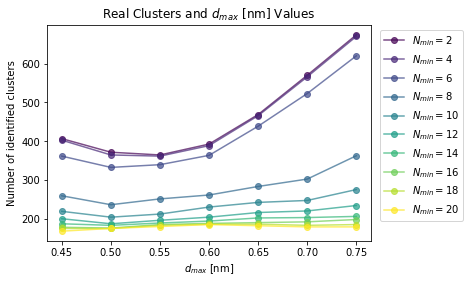

In [57]:
pgp.plot_real_clusters_across_swept_param(
    swept_parameters=d_max_values,
    swept_parameter_name="$d_{max}$ [nm]",
    random_runs=random_runs,
    xml_files=xml_files,
    n_min_values=n_min_values,
)

# plt.yscale("log")

## Find optimal N_min

Find the smallest $N_{min}$ value for each file that satisfies given threshold of real clusters. Default value = 95%

In [58]:
optimal_n_min_values_dmax, optimised_real_clusters_dmax, optimised_random_clusters_dmax = pgp.find_smallest_nmin(
    swept_parameters=d_max_values,
    swept_parameter_name="dmax",
    random_runs=random_runs,
    xml_files=xml_files,
    n_min_values=list(range(1, 200, 1)), # go through evey n_min possible up to a high number
    return_real_clusters=True,
    threshold=confidence_threshold
)

print(optimal_n_min_values_dmax)
print(optimised_real_clusters_dmax)
print(optimised_random_clusters_dmax)

dmax: 0.45 | n_min: 10 | fraction: 0.962 | real clusters: 220
dmax: 0.5 | n_min: 16 | fraction: 0.957 | real clusters: 177
dmax: 0.55 | n_min: 30 | fraction: 0.955 | real clusters: 175
dmax: 0.6 | n_min: 45 | fraction: 0.955 | real clusters: 168
dmax: 0.65 | n_min: 90 | fraction: 0.95 | real clusters: 142
dmax: 0.7 | n_min: 177 | fraction: 0.95 | real clusters: 115
[10, 16, 30, 45, 90, 177, 0]
[220, 177, 175, 168, 142, 115, 674]
[8, 7, 7, 7, 7, 5, 1398.5]


Text(0.5, 1.0, 'Cluster Analysis Parameters for Alloy D (RR33_31691)')

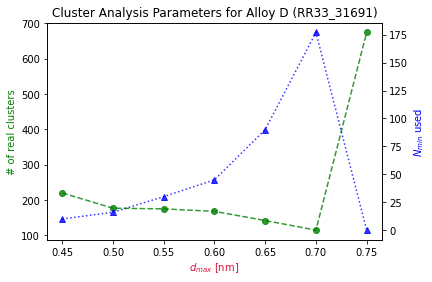

In [59]:
# plot the real clusters after optimisation to select the max point
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax2.plot(d_max_values, optimal_n_min_values_dmax, 'b^:', alpha=0.8)
ax1.plot(d_max_values, optimised_real_clusters_dmax, 'go--', alpha=0.8)



ax1.set_xlabel('$d_{max}$ [nm]', color='crimson')
ax1.set_ylabel('# of real clusters', color='g')
ax2.set_ylabel('$N_{min}$ used', color='b')
# plt.legend(loc='upper right')
plt.title("Cluster Analysis Parameters for Alloy D (RR33_31691)")
# plt.savefig('optimising_by_max_real_clusters_dmax_order9.jpg', dpi=150)

## Cluster Size vs Distance Distribution


In [60]:
# prepare the data
swept_parameter_name = "dmax"
df = cc.prepare_df_for_cluster_distr(xml_files, d_max_values, "dmax", include_random=True, n_mins=optimal_n_min_values_dmax)

In [61]:
# plot distributions of cluster sizes

fig = px.violin(df, y="Cluster Size", x="dmax", color="Type", box=False, points="all",
          hover_data=df.columns, color_discrete_map={'real':'#063970', 'random':'#e28743'})

fig.update_layout(
    title_text=f"Size Distributions and d<sub>max</sub> parameter<br>in {sample_name}",
    xaxis_title='d<sub>max</sub>',
    yaxis_title="Cluster Size [ions]",
    violingap=0, 
    violinmode='overlay', 
    template='simple_white',
    height=500, 
    width=800
    )

fig.update_yaxes(
    rangemode='nonnegative',
)

fig.update_traces(box_visible=True, meanline_visible=True)
fig.show()

In [62]:
# plot distribution of distances to closest clusters
fig = px.violin(df[df['Type']=='real'], y="Closest Cluster Distance", x="dmax", box=False, points="all",
          hover_data=df.columns, 
          color='Type',
          color_discrete_map={'real':'#700539', 'random':'#e28743'}
    )

fig.update_layout(
    title_text=f"kNN Distance Distributions and d<sub>max</sub> parameter<br>in {sample_name}",
    xaxis_title='d<sub>max</sub>',
    yaxis_title="kNN Distance [nm]",
    violingap=0, 
    violinmode='overlay', 
    template='simple_white',
    height=500, 
    width=800
    )

fig.update_yaxes(
    rangemode='nonnegative',
)

fig.update_traces(box_visible=True, meanline_visible=True)

fig.show()

In [63]:
optimal_n_min_values_dmax

[10, 16, 30, 45, 90, 177, 0]

In [65]:
# plot selected cluster(s) 
_ = cc.show_clusters_in_pos(
    xml_files=xml_files,
    clusters_to_plot=[321, 98], 
    swept_param_values=d_max_values,
    chosen_param_value=0.6,
    range_file_path=range_file_path
)


/home/pklups/.local/lib/python3.6/site-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Compare cluster shapes 

...across all param clusterID.pos files

In [67]:
# see selected cluster(s) across all param values in one scattered 3d graph
fig = cc.compare_selected_clusters_across_param(
    xml_files=xml_files,
    swept_param_values=d_max_values,
    swept_param_name='dmax',
    chosen_param_value=0.6,
    selected_clusters=[321, 98]
)
fig.show()

## Plotting Cluster Composition

In [68]:
# get ion colours from range file (IVAS colours) for further plotting
element_colours = cc.get_element_colours_from_range_file(range_file_path)

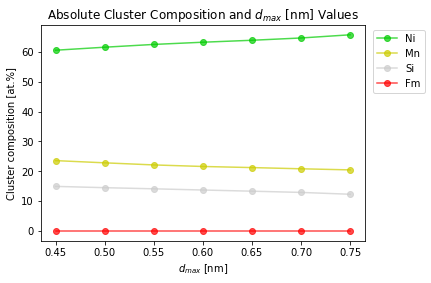

In [69]:
# retrieve the data needed from the cluster stats files for the composition plots
pgp.plot_cluster_composition_across_swept_param_absolute(
    swept_parameters=d_max_values,
    swept_parameter_name="$d_{max}$ [nm]",
    core_ions=core_ions,
    xml_files=xml_files,
    n_min_values_for_swept_parameters=optimal_n_min_values_dmax,
    exclude_ions=None,
    ion_colors=element_colours
)

# plt.savefig('composition_vs_dmax_order9.jpg', dpi=150)

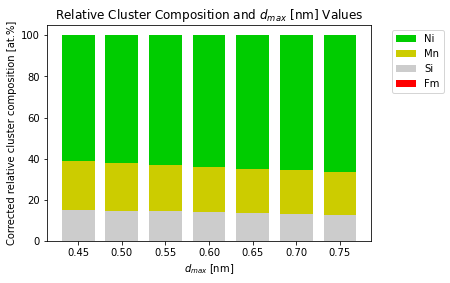

In [70]:
pgp.plot_cluster_composition_across_swept_param_relative(
    swept_parameters=d_max_values,
    swept_parameter_name="$d_{max}$ [nm]",
    core_ions=core_ions,
    xml_files=xml_files,
    n_min_values_for_swept_parameters=optimal_n_min_values_dmax,
    exclude_ions=None,
    ion_colors=element_colours
)

# Select the dataset
Select which parameters you want to use for further analysis

In [71]:
xml_files

['/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.45_order_6.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_6.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_6.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.65_order_6.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.7_order_6.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.75_order_6.xml']

In [72]:
optimal_n_min_values_dmax

[10, 16, 30, 45, 90, 177, 0]

In [38]:
################################## INPUT ##################################
selected_xml_file = xml_files[1]
n_min = 33

In [73]:
######################### OR FIND IT IN THE FOLDER #########################
selected_order = 6
selected_dmax = 0.55
n_min = 30

this_name = output_basename.format(d_max=selected_dmax, order=selected_order, sample_name=sample_name.replace(" ", "_"))
this_xml_file = output_folder+this_name+".xml"

xml_files_in_folder = [output_folder+xml_file for xml_file in os.listdir(output_folder) if xml_file.endswith(".xml")]

if this_xml_file in xml_files_in_folder:
    selected_xml_file = this_xml_file
    print("XML file with given parameters was found.")
    print(f"File: {selected_xml_file}")
    print("You can continue")
else:
    print(f"XML file with given parameters not found in {output_folder}")
    print("Are you sure you want to select these parameters?")
    print("You will have to run through them at least once")


XML file with given parameters was found.
File: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml
You can continue


# Correcting the datasets

In [74]:
# state the files
recon_name = selected_xml_file.split(sep='/')[-1].replace('.xml', '')
cluster_stats_file_path = selected_xml_file.replace(".xml", "_cluster-stats.txt")
unclustered_stats_file_path = selected_xml_file.replace(".xml", "_unclustered-stats.txt")
cluster_id_pos_file_path = selected_xml_file.replace(".xml", "_clusterID.pos")

# correct the files
corrected_files = cc.correct_cluster_files(
    pos_file_path=pos_file_path,
    rrng_file_path=range_file_path,
    cluster_stats_file_path=cluster_stats_file_path,
    unclustered_stats_file_path=unclustered_stats_file_path,
    clusterID_pos_file_path=cluster_id_pos_file_path,
    show_mass_spec=False,
    print_log=True,
    deconvolute_fm=True,
    nmin=n_min
)

Opening pos and range files
Labeling ions
Opening cluster stats files
Decomposing cluster stats files
Deconvoluting Fm peak in cluster stats files
Identifying and removing edge clusters
Preparing data for edge cluster removal
Calculating alphashape (might take a few seconds)
Alphashape calculated
Iterating through all clusters


100%|██████████| 365/365 [00:16<00:00, 21.87it/s]


Clusters smaller than nmin: 183 out of 365
Edge clusters: 58 out of 182 (18.9%)
Applying Nmin threshold to cluster stats files
Done


In [75]:
cluster_stats_df_all = corrected_files["cluster_stats_df_post_nmin_prior_edge"]
cluster_stats_df_nonedge = corrected_files["cluster_stats_df_post_nmin_post_edge"]
cluster_stats_df_edge = corrected_files["edge_cluster_stats_df"]
unclustered_stats_df = corrected_files["unclustered_stats_df"]

# Main graphs

## Ternary plot

In [76]:
n_min

30

In [82]:
# plot ternary diagram for 3 (+1*) elements. 
# Didn't create a function for easier adjustements of the graph

core_ion_colors = {
    "Cu": "orange",
    "Ni": "green",
    "Mn": "yellow",
    "P": "pink",
    "Si": "grey"
}


for i, xml_file in enumerate([selected_xml_file]):
    # create a new figure
    print(xml_file)
    # open the cluster stats file and create pandas dataframe
    local_df = cluster_stats_df_nonedge.copy()
    
    # add total ions in cluster value
    col_to_iterate = [col for col in local_df.columns if col not in cc.constant_cluster_stats_columns]
    local_df["Cluster Size"] = local_df.loc[:, col_to_iterate].sum(axis=1)
    
    # change n_min
    # local_df = local_df[local_df["Cluster Size"] >= nmin]
    
    # sort it by size
    local_df = local_df.sort_values(by="Cluster Size")
    
    previous_y_values = []
    # iterate through rows and find their core ions and total ions values
    x_values = np.arange(len(local_df["Cluster Size"]))
    for i2, core_ion in enumerate(core_ions):
        y_values = local_df[core_ion] / local_df["Cluster Size"] * 100

    # find the sum of ternary ions in each cluster    
    # local_df["Relative Cluster Size"] = local_df["Ni"] + local_df["Cu"] + local_df["Mn"] + local_df["Si"]
    local_df["Relative Cluster Size"] = local_df["Ni"] + local_df["Mn"] + local_df["Si"]
    local_df["Relative Cluster Size with Cu"] = local_df["Ni"] + local_df["Mn"] + local_df["Si"] + local_df['Cu']
    
    # once you have sum of ternary ions in each cluster, find relative concentration of each core ion
    # local_df["Mn+Si"] = local_df["Si"] + local_df["Mn"]
    # local_df["Relative Si"] = local_df["Si"] / relative_cluster_size
    # local_df["Relative Cu"] = local_df["Cu"] / relative_cluster_size
    local_df["Cu/MNSPC"] = local_df["Cu"] / local_df['Relative Cluster Size with Cu']
    # create column with negative z location 
    local_df["Z Axis"] = local_df["Z"] * -1

    # plotting using plotly ternary diagrams
    
    fig2 = px.scatter_ternary(
        local_df, a="Mn", b="Ni", c="Si", 
        hover_name="Cluster Size", # change later to show cluster ID
        size="Cluster Size", size_max=10,
        color="Z Axis", color_continuous_scale=px.colors.sequential.RdBu,
        opacity=0.75
#         marker=dict(
#             color='LightSkyBlue',
#             size='Relative Cluster Size',
#             size_max = 15,
#             opacity=0.5,
#             line=dict(
#                 color='MediumPurple',
#                 width=5
#             )
#         )
    )

    fig2.update_layout(
        title_text=sample_name.replace("_", " "),
        template='simple_white',
        coloraxis_colorbar=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=-0.1,
            len=0.5
            ),
        width=500,
        height=500
        ),
        
    fig.update_xaxes(title_font_family="Arial")
    
    fig2.show()


/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6.xml


## Bar plot

In [81]:
core_ions + bulk_ions

['Ni', 'Mn', 'Si', 'P', 'Fe', 'Cr', 'Cu', 'Mo', 'C', 'O', 'V', 'Al']

In [85]:
# same but with bar
# corrected compositions by excluding certain elements from the calculations
exclude_ions = ["Fe"]
# overlap_ions = {}
# n_mins = [1, 1, 1, 1, 1, 1]
n_mins = [n_min]
core_ion_colors = {
    "Ni": "green",
    "Mn": "yellow",
    "Si": "grey",
    "Cu": "orange",
    "P": "pink"
}
plot_with_Fe = False # not working

# before reading the data and after creating pandas dataframes, drop specified columns
# retrieve the data needed from the cluster stats files for the composition plots
core_ions_to_plot = [cr for cr in core_ions if cr != "Fm"]
core_ions_to_plot = [key for key in core_ion_colors] # for plotting

# create a new dictionary every time you run a correction to avoid correcting data more than once
dfs = {}
cluster_data = {}

for i, xml_file in enumerate([selected_xml_file]):
    # create a new figure
    fig = go.Figure()
    # n_min = n_mins[i]
    
    # open the cluster stats file and create pandas dataframe
    # sample_title = cluster_stats_file.replace("_cluster-stats.txt", "")
    local_df = cluster_stats_df_nonedge.copy()
    
    # insert all the corrections in here
    # exclude (matrix) ions by deleting the column
    local_df = local_df.drop(exclude_ions, axis=1)
     
    # add total ions in cluster value
    element_columns = [col for col in local_df.columns if col not in cc.constant_cluster_stats_columns]
    local_df["Cluster Size"] = local_df.loc[:, element_columns].sum(axis=1)
    
    # change n_min
    # local_df = local_df[local_df["Cluster Size"] >= n_min]
    
    # sort it by size
    local_df = local_df.sort_values(by="Cluster Size")
    
    previous_y_values = []
    # iterate through rows and find their core ions and total ions values
    x_values = np.arange(len(local_df["Cluster Size"]))
    for i2, core_ion in enumerate(core_ions):
        y_values = local_df[core_ion] / local_df["Cluster Size"] * 100

        fig.add_trace(go.Bar(
            x=x_values, 
            y=y_values, 
            name=core_ion,
            marker_color=core_ion_colors[core_ion],
        ))

    # assign for later use    
    dfs[i] = local_df

    # # reopen pandas dataframe to get the Fe content and plot a line
    # if plot_with_Fe:
    #     local_df_Fe = pd.read_csv(f"{output_folder}{cluster_stats_file}", sep="\t")
                                
    #     # # improve
    #     # # transfer the overlapping ions into "original" elements
    #     # local_df_Fe["Fe"] = local_df_Fe["Fe"] + (local_df_Fe["Fm"] * 0.1)
    #     # # delete the overlaping ions by multiplying by 0 to keep the total amount of ions constant
    #     # local_df_Fe["Ni"] = local_df_Fe["Ni"] + (local_df_Fe["Fm"] * 0.9)

    #     # add total ions in cluster value
    #     local_df_Fe["Cluster Size"] = local_df_Fe.iloc[:, 3:-2].sum(axis=1)

    #     # change n_min
    #     local_df_Fe = local_df_Fe[local_df_Fe["Cluster Size"] >= n_min]

    #     # sort it by size
    #     local_df_Fe = local_df_Fe.sort_values(by="Cluster Size")

    #     Fe_concentration = local_df_Fe["Fe"] / local_df_Fe["Cluster Size"] * 100

    #     # data smoothing?
    #     # plt.plot(x_values, Fe_concentration, 'r-', label="Fe content", alpha=0.7)
    #     fig.add_trace(go.Line(x=x_values, y=Fe_concentration, name="Fe", opacity=0.7, line_color="red"))
        
    # adjust the plot
    fig.update_layout(
        template='simple_white',
        barmode="stack", 
        title_text=sample_name,
        yaxis_range=[0,100],
        width=700,
        height=400,
        bargap=0,
    )

    # Set custom x-axis labels
    how_many_ticks = 15
    print(len(x_values))
    interval = round(len(x_values) / how_many_ticks)

    ticktext_data = local_df["Cluster Size"][::interval]
    ticktvals_data = x_values[::interval]
    
    fig.update_xaxes(
        ticktext=ticktext_data,
        tickvals=ticktvals_data,
        title_text="Cluster Size in Ions"
    )

    fig.update_yaxes(
        title_text="Concentration in at. %"
    )

    fig.show()


119


## Cluster Metrics
Here we will create a one-row dataframe with all basic information about the corrected dataset.

In [86]:
final_metrics = cc.get_cluster_metrics(
    reconstruction_name=recon_name,
    reconstruction_location=output_folder,
    sample_type="RTE21-4245 R10",
    cluster_stats_df=cluster_stats_df_all,
    cluster_stats_df_no_edge=cluster_stats_df_nonedge,
    unclustered_stats_df=unclustered_stats_df, 
    core_ions=core_ions,
    bulk_ions=bulk_ions,
    detector_efficiency=0.37, # 0.52 if LEAP5000+ or 0.37 if LEAP3000
    atomic_density_per_nm3=85.49, # 85.49 if BCC-iron
    excluded_Fe=True,
    dmax=selected_dmax,
    order=selected_order,
    n_min=n_min
)

In [87]:
cluster_analysis_summary = pd.DataFrame(final_metrics, index=[0])
# cluster_analysis_summary.loc[:, ['Nmin', 'Order', 'dmax [nm]']] = n_min, selected_order, selected_dmax
cluster_analysis_summary

,reconstruction name,sample type,cluster analysis type,volume fraction,number density per nm3,number density per nm3 error,clustered volume nm3,tip volume nm3,number of all clusters,number of non-edge clusters,number of edge clusters,d_max [nm],Order,N_min,core ions,bulk ions,Fe excluded?,detector efficiency,assumed atomic density per nm3,reconstruction_location
0,R33_31691_R10_dmax0.55_order_6,RTE21-4245 R10,main,0.023878,0.002459,0.000203,1417.772902,59376.345582,173,119,54,0.55,6,30,Ni+Mn+Si+Cu+P,P+Fe+Cr+Cu+Mo+C+O+V+Al,Excluded,0.37,85.49,/mnt/d/RTE_21_4245/AlloyD/R33_31691/


# CV01 

Estimate the error using CV01 method:
- check the cluster values for $Order + 1$ and $d_{max} + 0.05 nm$
- check the cluster values for $Order - 1$ and $d_{max} - 0.05 nm$
- use the max. difference as the error for each value.

Instead of running 4 additional cluster searches, we can shorten this process by running two only. Not only we save time but also the parameters used in all three (including the selected parameters) are reasonable. In other words, if we decided to use a higher $d_{max}$, we'd probably also pick a different $Order$ value to minimise the undesired effects of increased $d_{max}$.


In [95]:
# CV01 intervals
dmax_interval = 0.05 # nm
order_interval = 1

# state final parameters
final_dmax = selected_dmax
final_order = selected_order

# prepare two lists
xml_files_to_reuse = []
xml_files_to_run = []
xml_files_to_correct = []
cv01_parameters = {'Order': [], 'dmax':[] }

# name format
output_basename="{sample_name}_dmax{d_max}_order_{order}"

# go through each interval
for x in [-1, 1]:
    
    # wiggle param values
    this_dmax = round(final_dmax + (x * dmax_interval), 2) # round it to two decimals to avoid floating problems
    if this_dmax <= 0:
        this_dmax = 0.05
        print("dmax too low, changed to 0.05 nm")
    this_order = final_order + (x * order_interval)
    if this_order <= 0:
        this_order = 1
        print("Order too low, changed to 1")

    # save them
    cv01_parameters['Order'].append(this_order)
    cv01_parameters['dmax'].append(this_dmax)

    # create a name of the file in the given format
    this_name = output_basename.format(d_max=this_dmax, order=this_order, sample_name=sample_name.replace(" ", "_"))
    this_xml_file = output_folder+this_name+".xml"
    xml_files_to_correct.append(this_xml_file)
    
    # go through the xml files in this directory 
    saved_xml_files = [output_folder+file_path for file_path in os.listdir(output_folder) if file_path.endswith(".xml")]

    # see if we can reuse any cluster analyses
    if this_xml_file in saved_xml_files:
        xml_files_to_reuse.append(this_xml_file)
    else:
        # create the xml file
        xml_output = pgp.write_xml_with_relabelling(
            xmlFileName=this_name,
            posFile=pos_file_path,
            rangeFile=range_file_path,
            coreIons=core_ions,
            bulkIons=bulk_ions,
            relabelled_runs=random_runs,
            destination_folder=output_folder,
            nminV=2,
            dmax=this_dmax,
            dtd_file_location=dtd_location,
            dclassify=this_dmax,
            knn=this_order
        )
        # add it to the list
        xml_files_to_run.append(this_xml_file)

# summarise if we need to run any of the searches
if len(xml_files_to_run) == 0:
    print("Nothing to run! We can recycle previous analyses")
else:
    print("We will need to run the following xml files:")
    for file in xml_files_to_run:
        print(file)


We will need to run the following xml files:
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_5.xml
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_7.xml


In [96]:
# run the cluster analyses
current_directory = os.getcwd()
os.chdir(posgen_folder)
print(os.getcwd())

tic = perf_counter()
for i, xml_file in enumerate(xml_files_to_run):
    posgen_output = subprocess.call(["./posgen", xml_file])
    toc = perf_counter()
    time_for_file = pgp.seconds_to_hhmmss((toc-tic))
    print(f"File: {i+1}/{len(xml_files_to_run)} analysed. It took {time_for_file}.")
    tic = perf_counter()
    
os.chdir(current_directory)
print(os.getcwd())
print("Done")

/home/pklups/apttools-posgen-code
File: 1/2 analysed. It took 0h 0m 17s.
File: 2/2 analysed. It took 0h 0m 20s.
/mnt/c/Users/Peter/OneDrive - Nexus365/Projects/RR/NI/ubuntu_NI_codes
Done


In [97]:
# correct the results straight away 
# comment/uncomment sections that you want to exclude/include

matrix_ions = ["Fe"]
# decompose the clusters
for xml_file in (xml_files_to_run):
    
    # open both files
    cluster_stats_file_path = xml_file.replace(".xml", "_cluster-stats.txt")
    unclustered_stats_file_path = xml_file.replace(".xml", "_unclustered-stats.txt")
    csdf = pd.read_csv(cluster_stats_file_path, sep="\t")
    ucsdf = pd.read_csv(unclustered_stats_file_path, sep="\t")
    
    # decompose
    csdf = cc.decompose_cluster_stats(csdf)
    ucsdf = cc.decompose_cluster_stats(ucsdf)

    # deconvolute Fm peak
    csdf = cc.deconvolute_Fm_clusters(csdf)
    ucsdf = cc.deconvolute_Fm_clusters(ucsdf)
    
    # remove Fe ions in clusters and move them to matrix
    ucsdf.loc[0, matrix_ions] = ucsdf.loc[0, matrix_ions] + csdf.loc[:, matrix_ions].sum()
    csdf.loc[:, matrix_ions] = 0

    # save them as csv files
    csdf.to_csv(cluster_stats_file_path, sep='\t', index=False)
    ucsdf.to_csv(unclustered_stats_file_path, sep='\t', index=False)

    print(xml_file, "corrected")
 

/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_5.xml corrected
/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_7.xml corrected


In [98]:
# optimise Nmin based on the threshold 
optimal_n_min_values_cv01, _, _ = pgp.find_smallest_nmin(
    swept_parameters=[-1, 1],
    swept_parameter_name="CV01",
    random_runs=random_runs,
    xml_files=xml_files_to_correct,
    n_min_values=list(range(1, 200, 1)), # go through evey n_min possible up to a high number
    return_real_clusters=True,
    threshold=0.95
)


CV01: -1 | n_min: 26 | fraction: 0.953 | real clusters: 174
CV01: 1 | n_min: 34 | fraction: 0.952 | real clusters: 170


In [99]:
xml_files_to_correct

['/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_5.xml',
 '/mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_7.xml']

In [100]:
# run cluster corrections on both CV01 files

cv01_results = []

for i, cv01_xml_file in enumerate(xml_files_to_correct):

    print(f"Starting {cv01_xml_file}")

    # state the files
    recon_name = cv01_xml_file.split(sep='/')[-1].replace('.xml', '')
    cluster_stats_file_path = cv01_xml_file.replace(".xml", "_cluster-stats.txt")
    unclustered_stats_file_path = cv01_xml_file.replace(".xml", "_unclustered-stats.txt")
    cluster_id_pos_file_path = cv01_xml_file.replace(".xml", "_clusterID.pos")

    # correct the files
    corrected_files = cc.correct_cluster_files(
        pos_file_path=pos_file_path,
        rrng_file_path=range_file_path,
        cluster_stats_file_path=cluster_stats_file_path,
        unclustered_stats_file_path=unclustered_stats_file_path,
        clusterID_pos_file_path=cluster_id_pos_file_path,
        show_mass_spec=False,
        print_log=True,
        deconvolute_fm=True,
        nmin=optimal_n_min_values_cv01[i]
    )

    cluster_stats_df_all = corrected_files["cluster_stats_df_post_nmin_prior_edge"]
    cluster_stats_df_nonedge = corrected_files["cluster_stats_df_post_nmin_post_edge"]
    cluster_stats_df_edge = corrected_files["edge_cluster_stats_df"]
    unclustered_stats_df = corrected_files["unclustered_stats_df"]

    # get cluster metrics
    final_metrics = cc.get_cluster_metrics(
        reconstruction_name=recon_name,
        reconstruction_location=output_folder,
        sample_type="RTE21-4245 R15",
        cluster_stats_df=cluster_stats_df_all,
        cluster_stats_df_no_edge=cluster_stats_df_nonedge,
        unclustered_stats_df=unclustered_stats_df, 
        core_ions=core_ions,
        bulk_ions=bulk_ions,
        detector_efficiency=0.37, # 0.52 if LEAP5000+ or 0.37 if LEAP3000
        atomic_density_per_nm3=85.49, # 85.49 if BCC-iron
        excluded_Fe=True,
        n_min=optimal_n_min_values_cv01[i],
        order=cv01_parameters['Order'][i],
        dmax=cv01_parameters['dmax'][i],
        cluster_analysis_type="cv01" # main or cv01 
    )

    # save the results
    cv01_results.append(final_metrics)

    print(f"Finished {cv01_xml_file}")
    print("\n\n")

Starting /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_5.xml
Opening pos and range files
Labeling ions
Opening cluster stats files
Decomposing cluster stats files
Deconvoluting Fm peak in cluster stats files
Identifying and removing edge clusters
Preparing data for edge cluster removal
Calculating alphashape (might take a few seconds)
Alphashape calculated
Iterating through all clusters


100%|██████████| 518/518 [00:14<00:00, 35.16it/s]


Clusters smaller than nmin: 337 out of 518
Edge clusters: 52 out of 181 (11.2%)
Applying Nmin threshold to cluster stats files
Done
Finished /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_5.xml



Starting /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_7.xml
Opening pos and range files
Labeling ions
Opening cluster stats files
Decomposing cluster stats files
Deconvoluting Fm peak in cluster stats files
Identifying and removing edge clusters
Preparing data for edge cluster removal
Calculating alphashape (might take a few seconds)
Alphashape calculated
Iterating through all clusters


100%|██████████| 296/296 [00:15<00:00, 18.66it/s]


Clusters smaller than nmin: 119 out of 296
Edge clusters: 57 out of 177 (23.8%)
Applying Nmin threshold to cluster stats files
Done
Finished /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.6_order_7.xml





In [101]:
# add these metrics to the df 
cluster_analysis_summary = cluster_analysis_summary.append(cv01_results, ignore_index=True)
cluster_analysis_summary

,reconstruction name,sample type,cluster analysis type,volume fraction,number density per nm3,number density per nm3 error,clustered volume nm3,tip volume nm3,number of all clusters,number of non-edge clusters,number of edge clusters,d_max [nm],Order,N_min,core ions,bulk ions,Fe excluded?,detector efficiency,assumed atomic density per nm3,reconstruction_location
0,R33_31691_R10_dmax0.55_order_6,RTE21-4245 R10,main,0.023878,0.002459,0.000203,1417.772902,59376.345582,173,119,54,0.55,6,30,Ni+Mn+Si+Cu+P,P+Fe+Cr+Cu+Mo+C+O+V+Al,Excluded,0.37,85.49,/mnt/d/RTE_21_4245/AlloyD/R33_31691/
1,R33_31691_R10_dmax0.5_order_5,RTE21-4245 R15,cv01,0.022785,0.002509,0.000206,1352.868836,59376.345582,173,125,48,0.50,5,26,Ni+Mn+Si+Fm,P+Fe+Cr+Cu+Mo+C+O+V+Al,Excluded,0.37,85.49,/mnt/d/RTE_21_4245/AlloyD/R33_31691/
2,R33_31691_R10_dmax0.6_order_7,RTE21-4245 R15,cv01,0.024716,0.002408,0.000201,1467.533740,59376.345582,170,116,54,0.60,7,34,Ni+Mn+Si+Fm,P+Fe+Cr+Cu+Mo+C+O+V+Al,Excluded,0.37,85.49,/mnt/d/RTE_21_4245/AlloyD/R33_31691/


In [102]:
# calculate the CV01 errors
main_metrics = cluster_analysis_summary.loc[cluster_analysis_summary['cluster analysis type'] == 'main', :]
cv01_metrics = cluster_analysis_summary.loc[cluster_analysis_summary['cluster analysis type'] != 'main', :]

# list of values to calculate the error for
list_of_cols_for_cv01 = [
    'volume fraction', 
    'number density per nm3', 
    'clustered volume nm3', 
    'number of all clusters', 
    'number of non-edge clusters', 
    'number of edge clusters'
]

# go through each col and find the max distance from the main metric
for col in list_of_cols_for_cv01:
    differences = cv01_metrics.loc[:, col].subtract(main_metrics[col][0]) # subtract main from each cv01
    this_error = differences.abs().max() # find the biggest difference
    main_metrics.loc[:, f"{col} cv01 error"] = this_error

# print it out
pd.set_option('max_columns', None)
main_metrics

/home/pklups/.local/lib/python3.6/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/pklups/.local/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,reconstruction name,sample type,cluster analysis type,volume fraction,number density per nm3,number density per nm3 error,clustered volume nm3,tip volume nm3,number of all clusters,number of non-edge clusters,number of edge clusters,d_max [nm],Order,N_min,core ions,bulk ions,Fe excluded?,detector efficiency,assumed atomic density per nm3,reconstruction_location,volume fraction cv01 error,number density per nm3 cv01 error,clustered volume nm3 cv01 error,number of all clusters cv01 error,number of non-edge clusters cv01 error,number of edge clusters cv01 error
0,R33_31691_R10_dmax0.55_order_6,RTE21-4245 R10,main,0.023878,0.002459,0.000203,1417.772902,59376.345582,173,119,54,0.55,6,30,Ni+Mn+Si+Cu+P,P+Fe+Cr+Cu+Mo+C+O+V+Al,Excluded,0.37,85.49,/mnt/d/RTE_21_4245/AlloyD/R33_31691/,0.001093,0.000051,64.904067,3,6,6


In [103]:
# if you're happy with the result, overwrite the cluster analysis summary 
# with the main metrics with cv01 errors

cluster_analysis_summary = main_metrics

### Save cluster stats files for further analysis
Save the corrected cluster stats files in the output folder so that you can later compare them across different reconstructions and alloys.

In [104]:
# save this cluster analysis summary as csv file
cluster_analysis_summary.to_csv(f'{selected_xml_file.replace(".xml", "_cluster_analysis_corrected_summary.csv")}', sep="\t", index=False)
# save other corrected files too
cluster_stats_df_nonedge.to_csv(f'{selected_xml_file.replace(".xml", "_cluster-stats_corrected.csv")}', sep='\t', index=False)
unclustered_stats_df.to_csv(f'{selected_xml_file.replace(".xml", "_unclustered-stats_corrected.csv")}', sep='\t', index=False)


### Clean up your disk
You can use two cells below to delete unnecessary files.

In [105]:
# remove unclustered.pos files
unclustered_pos_files = [f"{output_folder}{x}" for x in os.listdir(output_folder) if "_unclustered.pos" in x]
for f in unclustered_pos_files:
    os.remove(f)
    print("removed:", f)

removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.35_order_8_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.45_order_6_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.45_order_8_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_10_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_12_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_2_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_4_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_6_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.55_order_8_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_5_unclustered.pos
removed: /mnt/d/RTE_21_4245/AlloyD/R33_31691/R33_31691_R10_dmax0.5_order_6_uncl

In [106]:
# remove unnecessary files (not selected)
selected_xml_file = ''
files_removed = []
for xf in xml_files:
    
    # go to the next xml file if that's the one you selected
    if xf == selected_xml_file:
        print(xf, "not removed")
        continue

    # find every posgen generated file based on the current xml file
    for every_file in os.listdir(output_folder):
        # print(every_file)
        if xf.split(sep="/")[-1].replace(".xml", "") in every_file:
            os.remove(f"{output_folder}{every_file}")
            files_removed.append(every_file)

# final message
print(f"Removed {len(files_removed)} files.")

Removed 222 files.


### Thanks for using PosgenPy
Any issues or feedback? Shoot me an email: przemyslaw.klups@materials.ox.ac.uk